In [2]:
#To setup environment 
!git clone https://github.com/Ikushi-Shih/Task1.git
!ls Task1/
#!rm -r Task1/
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import json
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
%matplotlib inline

fatal: destination path 'Task1' already exists and is not an empty directory.
ISO3166-1.alpha2.json  protonml-signups_for_ML.csv  README.md  task1.py


In [3]:
data = pd.read_csv('Task1/protonml-signups_for_ML.csv', parse_dates=['timestamp'])

In [4]:
data.head()

,timestamp,ip_country,ip_continent,js_timezone,http_lang,http_platform_name
0,2020-08-02 14:49:41,Italy,Europe,CET,fr-FR,Android
1,2020-08-16 07:03:09,Vietnam,Asia,Europe/Moscow,hy-am,Windows
2,2020-08-02 02:38:36,United-States,North-America,America/Los_Angeles,en-US,Windows
3,2020-08-19 05:39:47,Taiwan,Asia,Asia/Taipei,zh-TW,Windows
4,2020-08-25 21:16:09,United-States,North-America,America/Los_Angeles,en-us,iOS


In [5]:
data.describe()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  """Entry point for launching an IPython kernel.


,timestamp,ip_country,ip_continent,js_timezone,http_lang,http_platform_name
count,100000,99767,99767,85602,99961,99632
unique,97932,201,6,351,704,8
top,2020-08-13 09:10:16,United-States,North-America,Europe/Moscow,en-US,Windows
freq,3,28263,33307,14286,43316,62188
first,2020-07-28 01:35:15,NaN,NaN,NaN,NaN,NaN
last,2020-08-25 23:59:23,NaN,NaN,NaN,NaN,NaN


In [6]:
#Genertae time features from timestamp 
data['year'] = data['timestamp'].dt.year.astype('uint16')
data['month'] = data['timestamp'].dt.month.astype('uint8')
data['day'] = data['timestamp'].dt.day.astype('uint8')
data['hour'] = data['timestamp'].dt.hour.astype('uint8')
data['minute'] = data['timestamp'].dt.minute.astype('uint8')
data['second'] = data['timestamp'].dt.second.astype('uint8')
data.head()

,timestamp,ip_country,ip_continent,js_timezone,http_lang,http_platform_name,year,month,day,hour,minute,second
0,2020-08-02 14:49:41,Italy,Europe,CET,fr-FR,Android,2020,8,2,14,49,41
1,2020-08-16 07:03:09,Vietnam,Asia,Europe/Moscow,hy-am,Windows,2020,8,16,7,3,9
2,2020-08-02 02:38:36,United-States,North-America,America/Los_Angeles,en-US,Windows,2020,8,2,2,38,36
3,2020-08-19 05:39:47,Taiwan,Asia,Asia/Taipei,zh-TW,Windows,2020,8,19,5,39,47
4,2020-08-25 21:16:09,United-States,North-America,America/Los_Angeles,en-us,iOS,2020,8,25,21,16,9


In [7]:
data.describe()

,year,month,day,hour,minute,second
count,100000.0,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,2020.0,7.867850,15.076570,12.251420,29.612180,29.420660
std,0.0,0.338655,8.670393,6.753753,17.246046,17.346715
min,2020.0,7.000000,1.000000,0.000000,0.000000,0.000000
25%,2020.0,8.000000,8.000000,7.000000,15.000000,14.000000
50%,2020.0,8.000000,15.000000,13.000000,30.000000,29.000000
75%,2020.0,8.000000,22.000000,18.000000,45.000000,44.000000
max,2020.0,8.000000,31.000000,23.000000,59.000000,59.000000


In [8]:
#We found that year has no change, therefore we drop it
data.drop(columns=['year'], inplace=True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


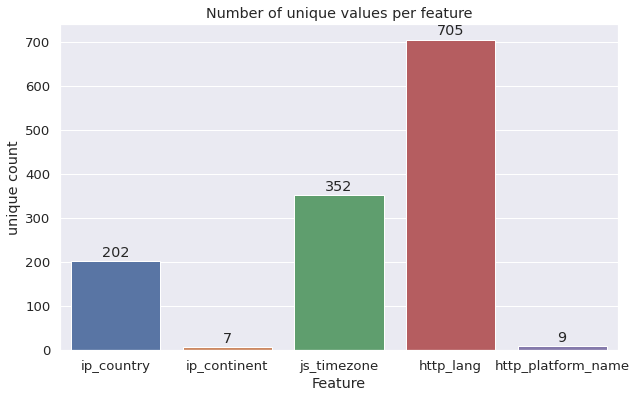

In [9]:
plt.figure(figsize=(10, 6))
cols = ['ip_country', 'ip_continent', 'js_timezone', 'http_lang', 'http_platform_name']
uniques = [len(data[col].unique()) for col in cols]
sns.set(font_scale=1.2)
ax = sns.barplot(cols, uniques)
ax.set(xlabel='Feature', ylabel='unique count', title='Number of unique values per feature')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 

In [10]:
data.head(5)

,timestamp,ip_country,ip_continent,js_timezone,http_lang,http_platform_name,month,day,hour,minute,second
0,2020-08-02 14:49:41,Italy,Europe,CET,fr-FR,Android,8,2,14,49,41
1,2020-08-16 07:03:09,Vietnam,Asia,Europe/Moscow,hy-am,Windows,8,16,7,3,9
2,2020-08-02 02:38:36,United-States,North-America,America/Los_Angeles,en-US,Windows,8,2,2,38,36
3,2020-08-19 05:39:47,Taiwan,Asia,Asia/Taipei,zh-TW,Windows,8,19,5,39,47
4,2020-08-25 21:16:09,United-States,North-America,America/Los_Angeles,en-us,iOS,8,25,21,16,9


In [11]:
#split js_timezone & http_lang
data['tz_country'], data['tz_city'] = data['js_timezone'].str.split('/', 1).str

delimiters = ',', '-', ':', ';', '_'
regexPattern = '|'.join(map(re.escape, delimiters))

temp = data['http_lang'].astype(str).apply(lambda x: re.split(regexPattern,x))
data['http_language']= temp.str[0]
data['http_language'] = data['http_language'].str.upper()
data['http_countries']= temp.str[1]
data['http_countries'] = data['http_countries'].str.upper()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  


In [12]:
data_timestamp = data['timestamp']
data.drop(columns=['timestamp','js_timezone','http_lang'], inplace = True)
data.head()

,ip_country,ip_continent,http_platform_name,month,day,hour,minute,second,tz_country,tz_city,http_language,http_countries
0,Italy,Europe,Android,8,2,14,49,41,CET,NaN,FR,FR
1,Vietnam,Asia,Windows,8,16,7,3,9,Europe,Moscow,HY,AM
2,United-States,North-America,Windows,8,2,2,38,36,America,Los_Angeles,EN,US
3,Taiwan,Asia,Windows,8,19,5,39,47,Asia,Taipei,ZH,TW
4,United-States,North-America,iOS,8,25,21,16,9,America,Los_Angeles,EN,US


In [13]:
data[['ip_country', 'ip_continent', 'http_platform_name', 'tz_country', 'tz_city', 'http_language', 'http_countries']].describe()

,ip_country,ip_continent,http_platform_name,tz_country,tz_city,http_language,http_countries
count,99767,99767,99632,85602,79992,100000,99420
unique,201,6,8,24,338,74,181
top,United-States,North-America,Windows,Europe,Moscow,EN,US
freq,28263,33307,62188,33912,14286,63551,51169


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   ip_country          99767 non-null   object
 1   ip_continent        99767 non-null   object
 2   http_platform_name  99632 non-null   object
 3   month               100000 non-null  uint8 
 4   day                 100000 non-null  uint8 
 5   hour                100000 non-null  uint8 
 6   minute              100000 non-null  uint8 
 7   second              100000 non-null  uint8 
 8   tz_country          85602 non-null   object
 9   tz_city             79992 non-null   object
 10  http_language       100000 non-null  object
 11  http_countries      99420 non-null   object
dtypes: object(7), uint8(5)
memory usage: 5.8+ MB


In [15]:
#utilize external iso code
with open('Task1/ISO3166-1.alpha2.json') as f:
    country_code = json.load(f)

iso_code = pd.DataFrame(list(country_code.items()), columns=['http_countries','http_country'])
iso_code.head()

,http_countries,http_country
0,AF,Afghanistan
1,AX,Aland Islands
2,AL,Albania
3,DZ,Algeria
4,AS,American Samoa


I utilized a external info of Country Code, to generate the original name of the country.

In [16]:
df = pd.merge(data, iso_code, on= 'http_countries', how= 'left')
df.head(10)

,ip_country,ip_continent,http_platform_name,month,day,hour,minute,second,tz_country,tz_city,http_language,http_countries,http_country
0,Italy,Europe,Android,8,2,14,49,41,CET,NaN,FR,FR,France
1,Vietnam,Asia,Windows,8,16,7,3,9,Europe,Moscow,HY,AM,Armenia
2,United-States,North-America,Windows,8,2,2,38,36,America,Los_Angeles,EN,US,United States
3,Taiwan,Asia,Windows,8,19,5,39,47,Asia,Taipei,ZH,TW,Taiwan
4,United-States,North-America,iOS,8,25,21,16,9,America,Los_Angeles,EN,US,United States
5,Estonia,Europe,Windows,7,31,13,32,41,Europe,Tallinn,EN,ET,Ethiopia
6,United-States,North-America,Windows,7,31,8,41,37,Africa,Lagos,EN,US,United States
7,Vietnam,Asia,Windows,8,20,4,14,7,Europe,Moscow,ZH,CN,China
8,Hashemite-Kingdom-of-Jordan,Asia,Android,7,29,9,58,40,NaN,NaN,AR,AE,United Arab Emirates
9,Japan,Asia,Windows,7,31,14,2,23,Asia,Tokyo,JA,EN,NaN


In [17]:
#Make these columns string type
df[['ip_country', 'ip_continent', 'http_platform_name', 'tz_country', 'tz_city', 'http_language', 'http_countries','http_country']] = df[['ip_country', 'ip_continent', 'http_platform_name', 'tz_country', 'tz_city', 'http_language', 'http_countries','http_country']].astype(str)

In [18]:
#Substitude any symbol in ip_country by ' '
temp = data['ip_country'].astype(str).apply(lambda x: re.sub(regexPattern,' ',x))
df['ip_country'] = temp

In [19]:
#Generate 2 booleen columns to compare the ip/http country & ip/timezone
def str_isin(conti,country):
    return country in conti

df['ip_tz_match'] = df.apply(lambda x: str_isin(x.ip_continent, x.tz_country), axis=1)
df['ip_http_match'] = df.apply(lambda x: str_isin(x.ip_country, x.http_country), axis=1)

In [20]:
df.head()

,ip_country,ip_continent,http_platform_name,month,day,hour,minute,second,tz_country,tz_city,http_language,http_countries,http_country,ip_tz_match,ip_http_match
0,Italy,Europe,Android,8,2,14,49,41,CET,nan,FR,FR,France,False,False
1,Vietnam,Asia,Windows,8,16,7,3,9,Europe,Moscow,HY,AM,Armenia,False,False
2,United States,North-America,Windows,8,2,2,38,36,America,Los_Angeles,EN,US,United States,True,True
3,Taiwan,Asia,Windows,8,19,5,39,47,Asia,Taipei,ZH,TW,Taiwan,True,True
4,United States,North-America,iOS,8,25,21,16,9,America,Los_Angeles,EN,US,United States,True,True


In [21]:
#to seperate the time from other features & drop 'http_country' since we have enough info for it

df.drop(columns=['http_country'],inplace=True)
df_time = df
df.drop(columns=['month','day','hour','minute','second'],inplace=True)

In [22]:
df['tz_country'].value_counts()

Europe           33912
America          28450
nan              14398
Asia             12527
UTC               5402
Africa            2750
Australia         1442
Etc                357
Pacific            322
Atlantic           191
CET                142
not available       36
Indian              33
WET                 11
Arctic               5
MST                  4
UTC-06:00            4
UTC-04:00            3
Antarctica           3
EET                  2
UTC-03:00            2
UTC-05:00            1
UTC-07:00            1
UTC-09:30            1
HST                  1
Name: tz_country, dtype: int64

In [23]:
#To groupup several small subsets of data
def replace_time(txt):
    if txt == 'not available' :return 'nan'
    elif txt == 'Etc' :return 'nan'
    elif txt == 'WET' :return 'Europe'
    elif txt == 'UTC-06:00' :return 'America'
    elif txt == 'MST' :return 'America'
    elif txt == 'Antarctica' :return 'nan'
    elif txt == 'UTC-04:00' :return 'America'
    elif txt == 'EET' :return 'Europe'
    elif txt == 'UTC-03:00' :return 'Atlantic'
    elif txt == 'UTC-07:00' :return 'America'
    elif txt == 'UTC-09:30' :return 'America'
    elif txt == 'HST' :return 'Pacific'
    elif txt == 'UTC-05:00' :return 'America'
    elif txt == 'Etc' :return 'nan'
    elif txt == 'Etc' :return 'nan'
    else : return txt

df['tz_country'] = df['tz_country'].astype(str).apply(lambda x: replace_time(x))

In [24]:
df['tz_city'].value_counts()

nan                       20008
Moscow                    14286
New_York                   8605
Los_Angeles                6817
Chicago                    4200
London                     4032
Calcutta                   2695
Paris                      2672
Berlin                     2315
Shanghai                   2152
Sao_Paulo                  1796
Rome                       1220
Kiev                       1096
Warsaw                     1000
Toronto                     993
Madrid                      953
Lagos                       941
Denver                      843
Sydney                      803
Mexico_City                 634
Amsterdam                   621
Bucharest                   616
Istanbul                    602
Phoenix                     566
Tehran                      536
Stockholm                   524
Tokyo                       519
Bangkok                     513
Jakarta                     508
Singapore                   490
Dhaka                       487
Cairo   

In [25]:
#To groupup several small subsets of data

sizes = df['tz_city'].value_counts()
bad = sizes.index[sizes < 50]
df.loc[df["tz_city"].isin(bad), "tz_city"] = "other"

In [26]:
df['tz_city'].value_counts()

nan                       20008
Moscow                    14286
New_York                   8605
Los_Angeles                6817
Chicago                    4200
London                     4032
Calcutta                   2695
Paris                      2672
other                      2325
Berlin                     2315
Shanghai                   2152
Sao_Paulo                  1796
Rome                       1220
Kiev                       1096
Warsaw                     1000
Toronto                     993
Madrid                      953
Lagos                       941
Denver                      843
Sydney                      803
Mexico_City                 634
Amsterdam                   621
Bucharest                   616
Istanbul                    602
Phoenix                     566
Tehran                      536
Stockholm                   524
Tokyo                       519
Bangkok                     513
Jakarta                     508
Singapore                   490
Dhaka   

In [27]:
df['http_language'].value_counts()

EN     63551
FR      5265
ES      4361
RU      3523
ZH      3110
PT      3038
DE      2317
PL      1437
IT      1341
TR      1185
JA      1107
FI       701
UK       699
NL       650
BG       648
BE       581
HI       569
HY       568
TL       559
AZ       557
UZ       537
KO       528
SV       507
AR       451
ID       223
RO       203
HU       203
NB       159
VI       156
CS       149
EL       147
DA       141
FA       124
SK       102
IN        88
HR        84
HE        79
SR        53
LT        52
TH        42
SL        41
NAN       39
CA        35
LV        20
ET        13
IW         6
BS         6
MS         5
BN         3
FIL        3
YUE        3
AM         2
CKB        2
ACH        2
GA         2
US         2
UND        2
MK         2
MR         2
IA         1
MN         1
AK         1
NN         1
NO         1
EU         1
BR         1
PA         1
JV         1
CY         1
SCN        1
UR         1
GL         1
LB         1
MY         1
Name: http_language, dtype: int64

In [28]:
#To make sure there is enough data for each category
sizes = df['http_language'].value_counts()
bad = sizes.index[sizes < 30]
df.loc[df["http_language"].isin(bad), "http_language"] = "other"

In [29]:
#To make sure there is enough data for each category
sizes = df['http_countries'].value_counts()
bad = sizes.index[sizes < 30]
df.loc[df["http_countries"].isin(bad), "http_countries"] = "other"

In [30]:
#To make sure there is enough data for each category
sizes = df['ip_country'].value_counts()
bad = sizes.index[sizes < 30]
df.loc[df["ip_country"].isin(bad), "ip_country"] = "other"

In [31]:
df.describe()

,ip_country,ip_continent,http_platform_name,tz_country,tz_city,http_language,http_countries,ip_tz_match,ip_http_match
count,100000,100000,100000,100000,100000,100000,100000,100000,100000
unique,117,7,9,12,104,44,69,2,2
top,United States,North-America,Windows,Europe,nan,EN,US,True,False
freq,28263,33307,62188,33925,20008,63551,51169,56921,55186


In [64]:
from sklearn.preprocessing import LabelEncoder
train = df.apply(LabelEncoder().fit_transform)

In [33]:
train.head()

,ip_country,ip_continent,http_platform_name,tz_country,tz_city,http_language,http_countries,ip_tz_match,ip_http_match
0,50,2,0,6,102,13,24,0,0
1,113,1,6,7,64,18,2,0,0
2,110,3,6,1,57,9,61,1,1
3,101,1,6,3,85,42,59,1,1
4,110,3,7,1,57,9,61,1,1


In [34]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=10).fit(train)
kmeans.cluster_centers_

array([[104.380292  ,   2.3126294 ,   4.8987649 ,   4.93008853,
         66.78885557,  13.04249661,  49.91252588,   0.59241808,
          0.59318555],
       [ 33.50144414,   2.21258369,   4.68324143,   6.57434029,
         82.39828673,  15.69850335,  35.9513588 ,   0.39868058,
          0.29562164],
       [ 39.44075829,   1.85196979,   4.57938389,   4.12907287,
         23.803984  ,  11.21238152,  44.49866706,   0.8576718 ,
          0.19046209]])

In [35]:
#I choose k = 3 because we have normal usage, high & low usage
result = kmeans.predict(train)
unique, counts = np.unique(result, return_counts=True)
dict(zip(unique, counts))

{0: 56028, 1: 30468, 2: 13504}

In [36]:
train_time = pd.concat([train, data[['month','day','hour','minute','second']]],axis = 1)

In [37]:
#Time considered
kmeans = KMeans(n_clusters=3, random_state=0).fit(train_time)
kmeans.cluster_centers_
result = kmeans.predict(train_time)
unique, counts = np.unique(result, return_counts=True)
dict(zip(unique, counts))

{0: 56031, 1: 30474, 2: 13495}

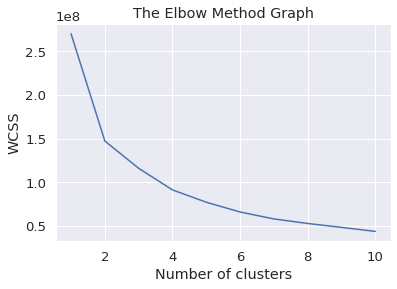

In [38]:
#3 Using the elbow method to find out the optimal number of #clusters. 
#KMeans class from the sklearn library.
wcss=[]
#this loop will fit the k-means algorithm to our data and 
#second we will compute the within cluster sum of squares and #appended to our wcss list.
for i in range(1,11): 
      kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=300,  n_init=10,random_state=0 )
      kmeans.fit(train)
      #kmeans algorithm fits to the X dataset
      wcss.append(kmeans.inertia_)
      #kmeans inertia_ attribute is:  Sum of squared distances of samples #to their closest cluster center.
#4.Plot the elbow graph
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

From this graph we can know that 4 cluster may be the best option.

In [39]:
train.nunique()

ip_country            117
ip_continent            7
http_platform_name      9
tz_country             12
tz_city               104
http_language          44
http_countries         69
ip_tz_match             2
ip_http_match           2
dtype: int64

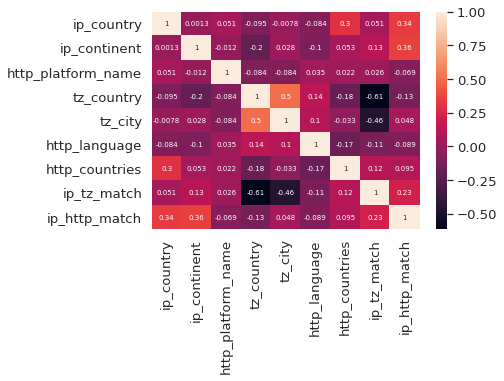

In [40]:
train_corr = train.corr()
sns.heatmap(train_corr, annot=True, annot_kws={"size": 7})

From this heatmap we find that certain ip_http_match is associated with ip_country. 

We can see there are several ip_country, city, language, http_countries, platform a lot higher than others. 
As we see in ip_http_match, we find most ip_country doesn't match with http country
I will want to investigate further into. 


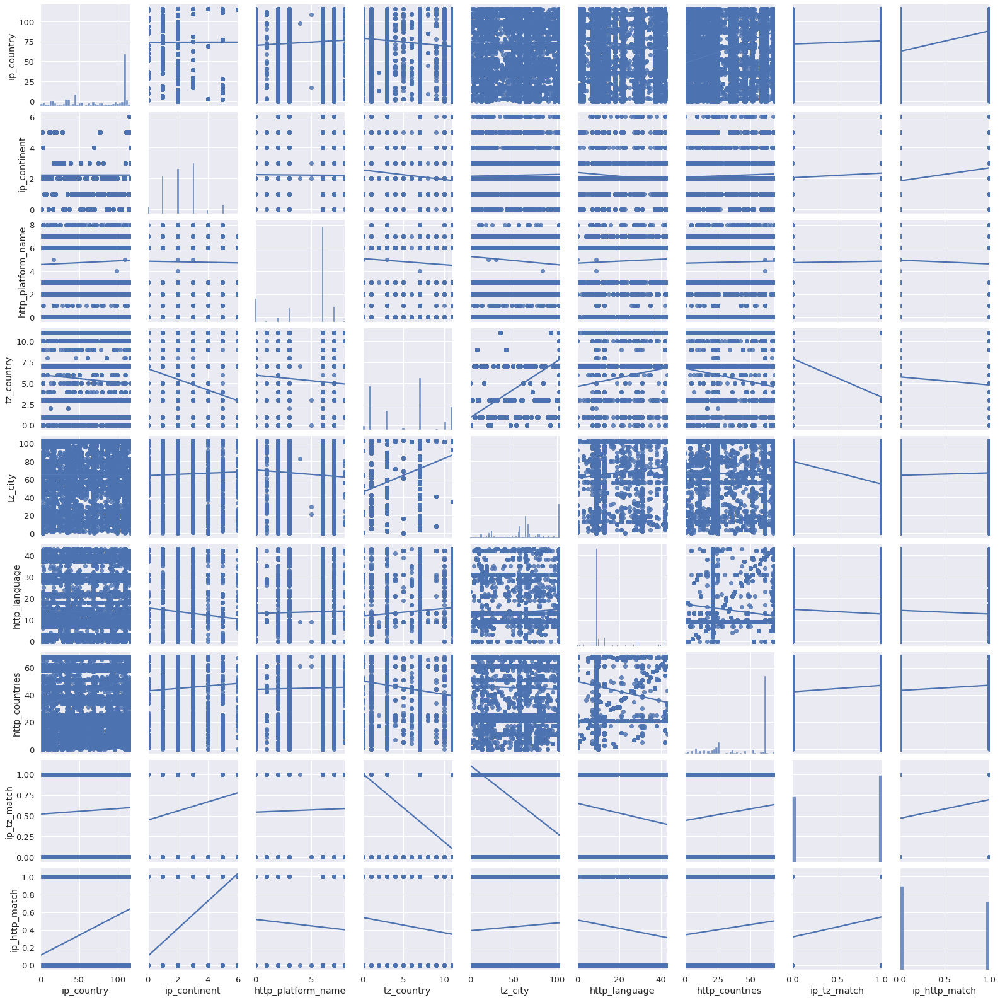

In [41]:

# with regression
sns.pairplot(train, kind="reg")
plt.show()

In [42]:
train.columns

Index(['ip_country', 'ip_continent', 'http_platform_name', 'tz_country',
       'tz_city', 'http_language', 'http_countries', 'ip_tz_match',
       'ip_http_match'],
      dtype='object')

In [65]:
#the platform 4 & 5 has a discrete distribution
train_timestamp = pd.concat([train, data_timestamp],axis = 1)
sns.regplot(x=train_timestamp["timestamp"], y=train_timestamp["http_platform_name"], fit_reg=False)

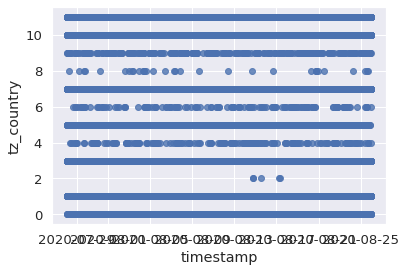

In [44]:
train_timestamp = pd.concat([train, data_timestamp],axis = 1)
sns.regplot(x=train_timestamp["timestamp"], y=train_timestamp["tz_country"], fit_reg=False)

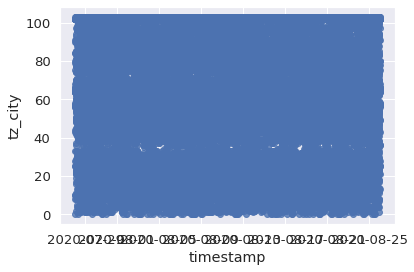

In [45]:
train_timestamp = pd.concat([train, data_timestamp],axis = 1)
sns.regplot(x=train_timestamp["timestamp"], y=train_timestamp["tz_city"], fit_reg=False)

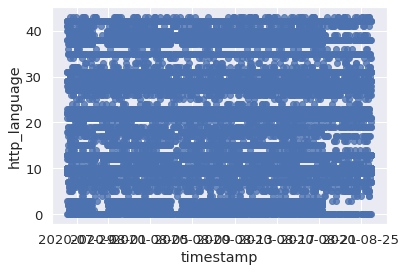

In [46]:
train_timestamp = pd.concat([train, data_timestamp],axis = 1)
sns.regplot(x=train_timestamp["timestamp"], y=train_timestamp["http_language"], fit_reg=False)

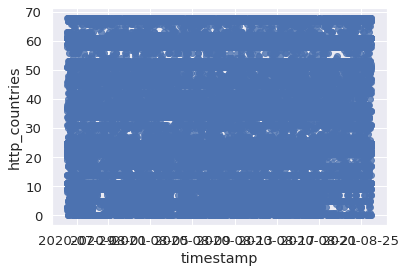

In [47]:
train_timestamp = pd.concat([train, data_timestamp],axis = 1)
sns.regplot(x=train_timestamp["timestamp"], y=train_timestamp["http_countries"], fit_reg=False)

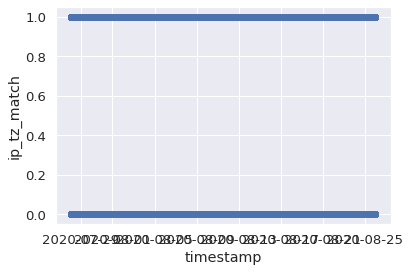

In [48]:
train_timestamp = pd.concat([train, data_timestamp],axis = 1)
sns.regplot(x=train_timestamp["timestamp"], y=train_timestamp["ip_tz_match"], fit_reg=False)

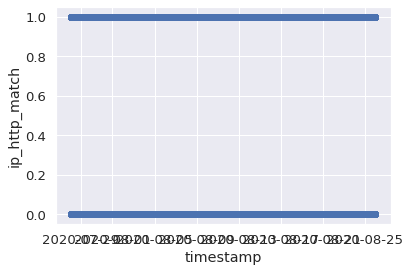

In [49]:
train_timestamp = pd.concat([train, data_timestamp],axis = 1)
sns.regplot(x=train_timestamp["timestamp"], y=train_timestamp["ip_http_match"], fit_reg=False)

In [50]:
k= df[df['ip_country'] == 'United States']
k

,ip_country,ip_continent,http_platform_name,tz_country,tz_city,http_language,http_countries,ip_tz_match,ip_http_match
2,United States,North-America,Windows,America,Los_Angeles,EN,US,True,True
4,United States,North-America,iOS,America,Los_Angeles,EN,US,True,True
6,United States,North-America,Windows,Africa,Lagos,EN,US,False,True
12,United States,North-America,Android,America,New_York,EN,US,True,True
14,United States,North-America,Windows,America,Los_Angeles,EN,US,True,True
15,United States,North-America,Mac OS,America,Chicago,EN,US,True,True
16,United States,North-America,Android,Africa,Lagos,EN,US,False,True
17,United States,North-America,iOS,America,Toronto,EN,CA,True,False
22,United States,North-America,Android,nan,nan,EN,US,False,True
24,United States,North-America,Mac OS,Asia,Shanghai,ZH,CN,False,False


In [51]:
df_timestamp = pd.concat([df, data_timestamp], axis = 1)
k= df_timestamp[df['ip_http_match'] == False]

In [52]:
kt = k.sort_values(by = "timestamp")
kt.head(100)

,ip_country,ip_continent,http_platform_name,tz_country,tz_city,http_language,http_countries,ip_tz_match,ip_http_match,timestamp
24782,Turkey,Asia,Android,Europe,Istanbul,EN,GB,False,False,2020-07-28 01:35:15
47237,Chile,South-America,Windows,Europe,Moscow,JA,JP,False,False,2020-07-28 01:36:21
77134,Canada,North-America,Windows,America,Toronto,EN,US,True,False,2020-07-28 01:36:23
52097,Australia,Oceania,Mac OS,Australia,Adelaide,EN,US,False,False,2020-07-28 01:39:21
13050,United Kingdom,Europe,Windows,Pacific,Auckland,ZH,TW,False,False,2020-07-28 01:39:45
20209,Vietnam,Asia,Windows,Europe,Moscow,TR,TR,False,False,2020-07-28 01:43:12
46072,Philippines,Asia,Android,nan,nan,EN,GB,False,False,2020-07-28 01:43:49
93473,Japan,Asia,Windows,Asia,Tokyo,JA,EN,True,False,2020-07-28 01:44:11
39579,Russia,Europe,Mac OS,Europe,Moscow,EN,US,True,False,2020-07-28 01:45:07
64236,Indonesia,Asia,Windows,Europe,Moscow,FR,FR,False,False,2020-07-28 01:46:26


In [53]:
kt.shape

(55186, 10)

In [54]:
kt.head(100)

,ip_country,ip_continent,http_platform_name,tz_country,tz_city,http_language,http_countries,ip_tz_match,ip_http_match,timestamp
24782,Turkey,Asia,Android,Europe,Istanbul,EN,GB,False,False,2020-07-28 01:35:15
47237,Chile,South-America,Windows,Europe,Moscow,JA,JP,False,False,2020-07-28 01:36:21
77134,Canada,North-America,Windows,America,Toronto,EN,US,True,False,2020-07-28 01:36:23
52097,Australia,Oceania,Mac OS,Australia,Adelaide,EN,US,False,False,2020-07-28 01:39:21
13050,United Kingdom,Europe,Windows,Pacific,Auckland,ZH,TW,False,False,2020-07-28 01:39:45
20209,Vietnam,Asia,Windows,Europe,Moscow,TR,TR,False,False,2020-07-28 01:43:12
46072,Philippines,Asia,Android,nan,nan,EN,GB,False,False,2020-07-28 01:43:49
93473,Japan,Asia,Windows,Asia,Tokyo,JA,EN,True,False,2020-07-28 01:44:11
39579,Russia,Europe,Mac OS,Europe,Moscow,EN,US,True,False,2020-07-28 01:45:07
64236,Indonesia,Asia,Windows,Europe,Moscow,FR,FR,False,False,2020-07-28 01:46:26


In [55]:
kmeans = KMeans(n_clusters=3, random_state=10).fit(train)
kmeans.cluster_centers_

#I choose k = 3 because we have normal usage, high & low usage
result = kmeans.predict(train)
unique, counts = np.unique(result, return_counts=True)
dict(zip(unique, counts))

{0: 56028, 1: 30468, 2: 13504}

In [56]:
result = kmeans.predict(train[train['ip_http_match'] == False])
unique, counts = np.unique(result, return_counts=True)
dict(zip(unique, counts))

{0: 22793, 1: 21461, 2: 10932}

Therefore I think ip_http_match has a high probability of malicious actions at 'group 2' of the kmeans model

In [57]:
result = kmeans.predict(train[train['ip_tz_match'] == False])
unique, counts = np.unique(result, return_counts=True)
dict(zip(unique, counts))

{0: 22836, 1: 18321, 2: 1922}

In [69]:
train_timestamp.set_index('timestamp', inplace=True)

In [76]:
train_timestamp = train_timestamp.sort_index()

In [78]:
train_timestamp.head()

,ip_country,ip_continent,http_platform_name,tz_country,tz_city,http_language,http_countries,ip_tz_match,ip_http_match
timestamp,,,,,,,,,
2020-07-28 01:35:15,106,1,0,7,43,9,25,0,0
2020-07-28 01:35:26,113,1,7,11,102,41,63,0,1
2020-07-28 01:36:21,18,5,6,7,64,22,37,0,0
2020-07-28 01:36:23,17,3,6,1,91,9,61,1,0
2020-07-28 01:36:33,109,2,0,7,56,9,25,1,1


In [82]:
train_timestamp.groupby(['http_platform_name','http_language','http_countries'])

Conclusion

I assume people want to create multiple mail account my use the same http_language-http_countries & OS combunation. 

What I will do in the future is to :

1.   groupby ['http_language','http_countries', 'http_platform_name'] and calculate the delta of time.
2.   Flag first time entries and stop the other same entries within certain delta of time



